In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
from synth_ts.synth_timeserie_generator import *
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
color_pal = sns.color_palette()
plt.style.use('fivethirtyeight')

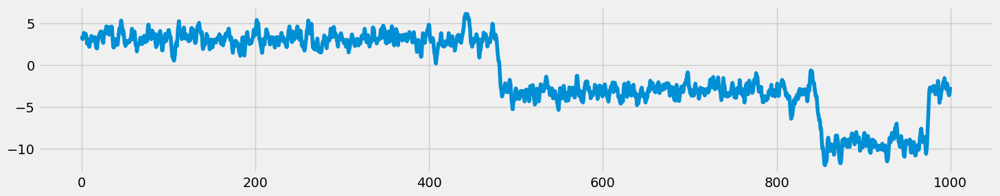

In [3]:
STEP_SIZE = 0.1
N_STEPS = 10000
LAMBDA = 1.5
D = 1
ALPHA = 0.85

fig, ax = plt.subplots(figsize=(16, 3))
integral_algo = IntegralAlgorithm(x0=np.pi, lambd=LAMBDA, n_steps=N_STEPS, alpha=ALPHA, D=D)
ts, _ = integral_algo.generate(step_size=STEP_SIZE)
ax.plot(np.arange(0, STEP_SIZE * N_STEPS, STEP_SIZE), ts)

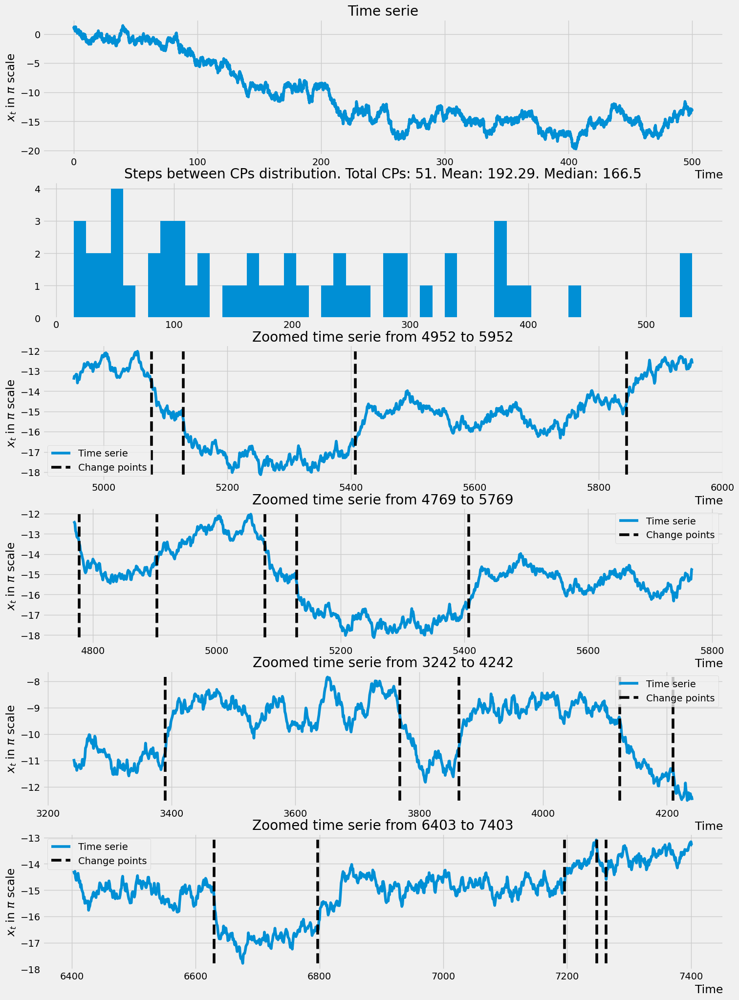

In [12]:
STEP_SIZE = 0.05
MIN_STABILITY_DURATION = 1
ID = '000'
TS_PARAMS = {
    'x0': np.pi,
    'lambd': 125,
    'n_steps': 10000,
    'alpha': 1.75,
    'D': 0.2
}
integral_algo = IntegralAlgorithm(**TS_PARAMS)
ts, _ = integral_algo.generate(step_size=STEP_SIZE)
cp_ixs = find_change_points(ts, 1)
ts = demonstrate(TS_PARAMS, STEP_SIZE, ts, cp_ixs, max_winlen=1500, bins=50)

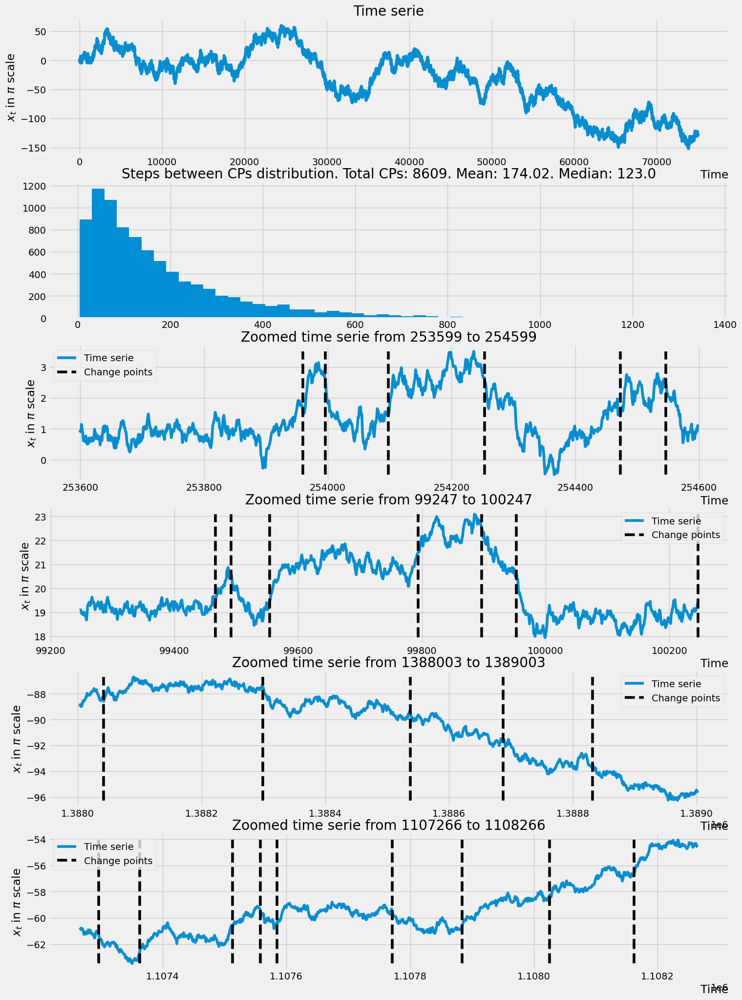

In [5]:
STEP_SIZE = 0.05
MIN_STABILITY_DURATION = 1
ID = '000'
TS_PARAMS = {
    'x0': np.pi,
    'lambd': 125,
    'n_steps': 1500000,
    'alpha': 1.75,
    'D': 0.2
}

with open('timeseries/timeserie_000.npy', 'rb') as f:
    ts = np.load(f)
ts = ts * np.pi

cp_ixs = find_change_points(ts, 1)
ts = demonstrate(TS_PARAMS, STEP_SIZE, ts, cp_ixs, max_winlen=1500, bins=50)

# Эксперимент 31

несбалансированный. призаки - абсолютные значения

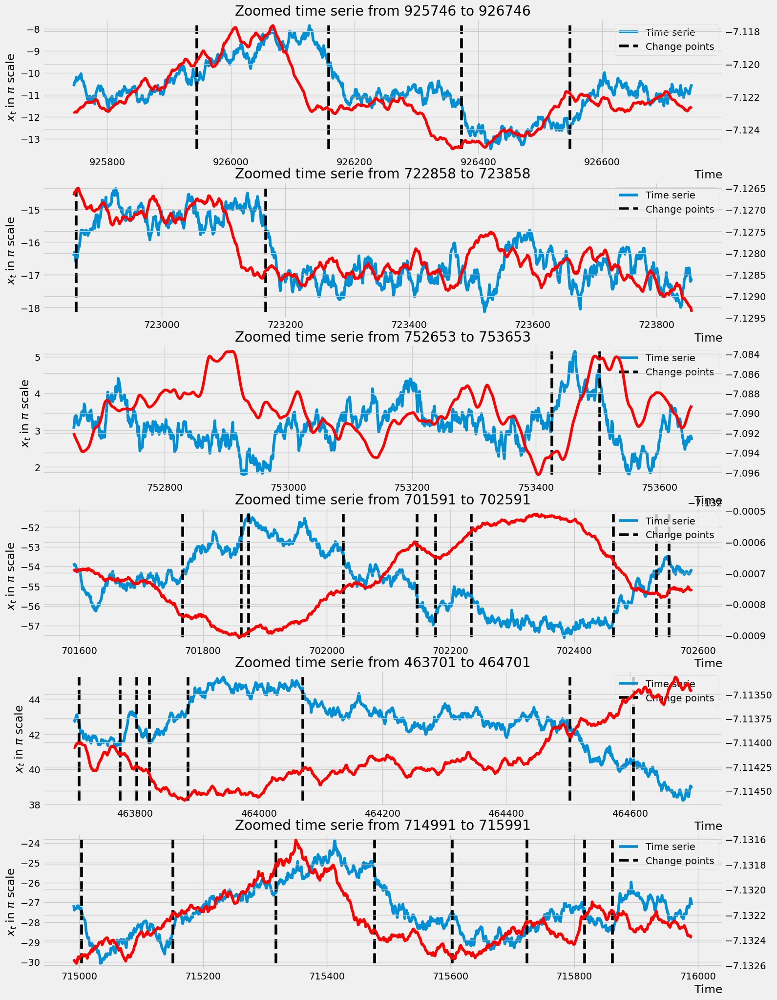

In [7]:
from synth_ts.synth_timeserie_generator import demonstrate_result
T = round(len(ts) * 0.75)

with open('ts_probs/000_31.npy', 'rb') as f:
    probs = np.load(f)
cp_ixs = np.array(cp_ixs)
demonstrate_result(ts[:T], cp_ixs[np.where(cp_ixs < T)], probs[:T], T=T)

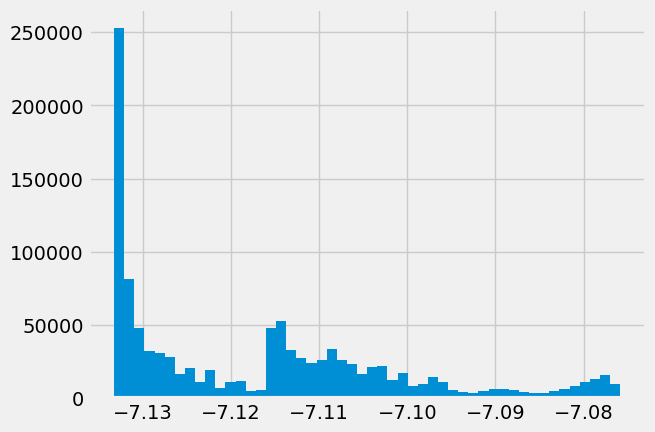

In [8]:
_ = plt.hist(probs[:T], bins=50)

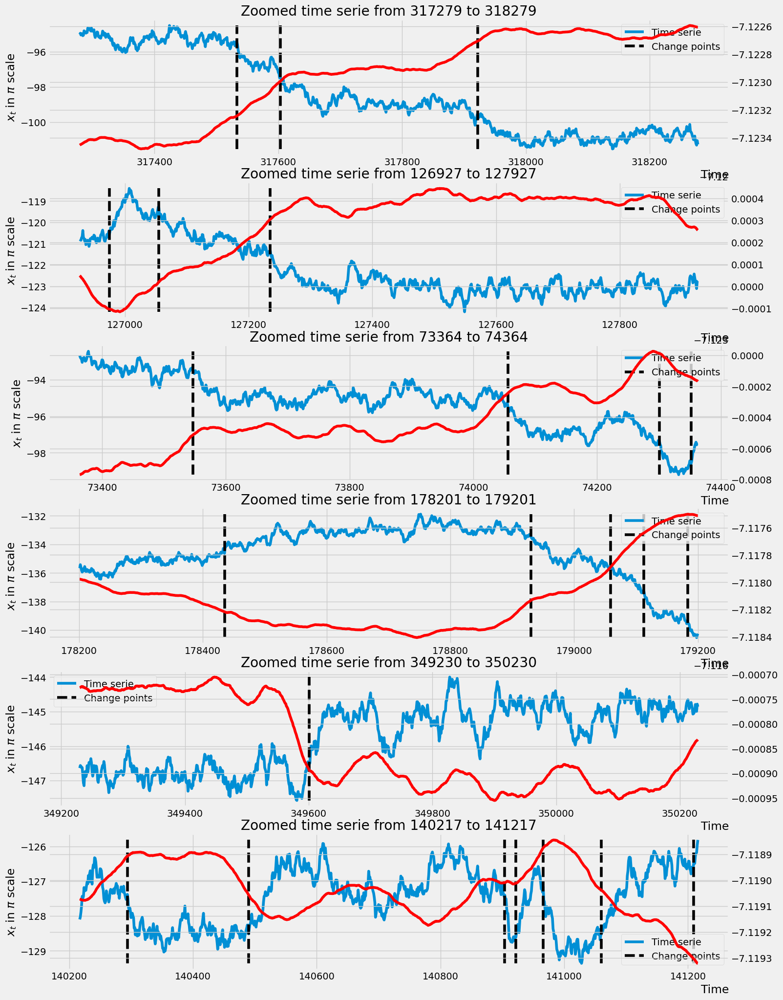

In [9]:
demonstrate_result(ts[T:], cp_ixs[np.where(cp_ixs >= T)], probs[T:], val=True, T=T)

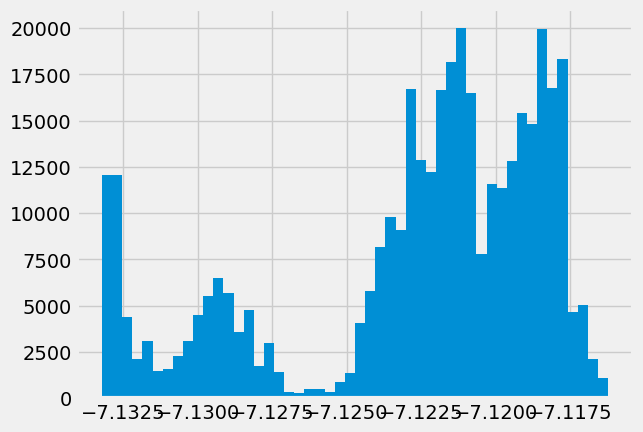

In [10]:
_ = plt.hist(probs[T:], bins=50)

# Эксперимент 33:

несбалансированный. Обучаюсь на бинарных прихнаках

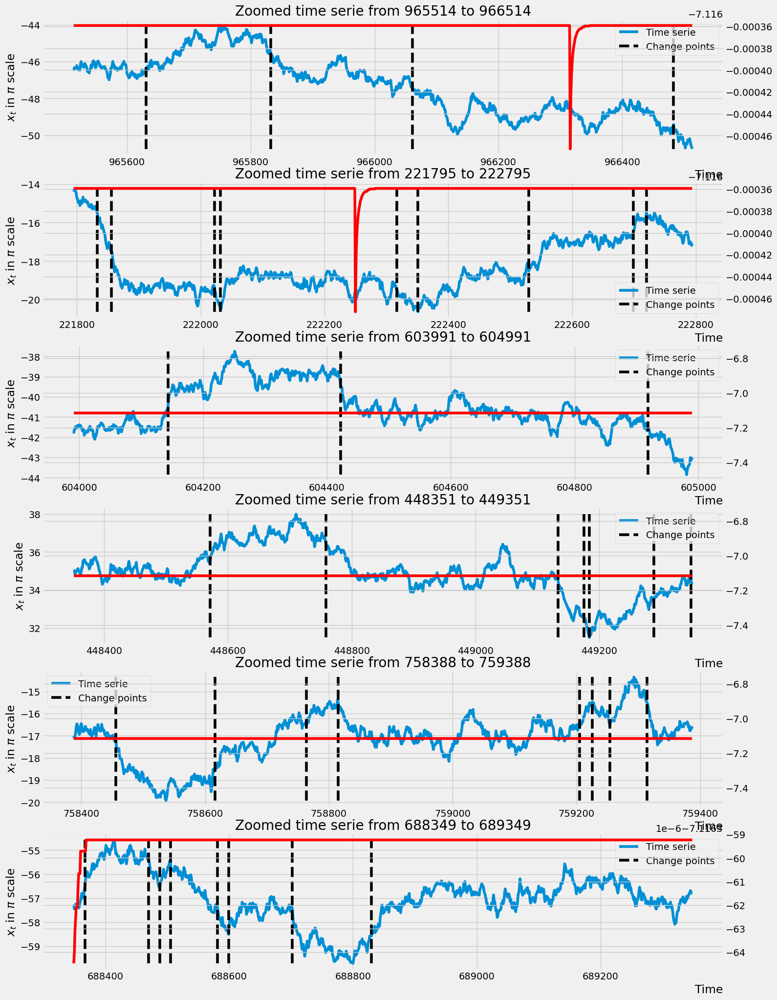

In [11]:
T = round(len(ts) * 0.75)

with open('ts_probs/000_33.npy', 'rb') as f:
    probs = np.load(f)
cp_ixs = np.array(cp_ixs)
demonstrate_result(ts[:T], cp_ixs[np.where(cp_ixs < T)], probs[:T], T=T)

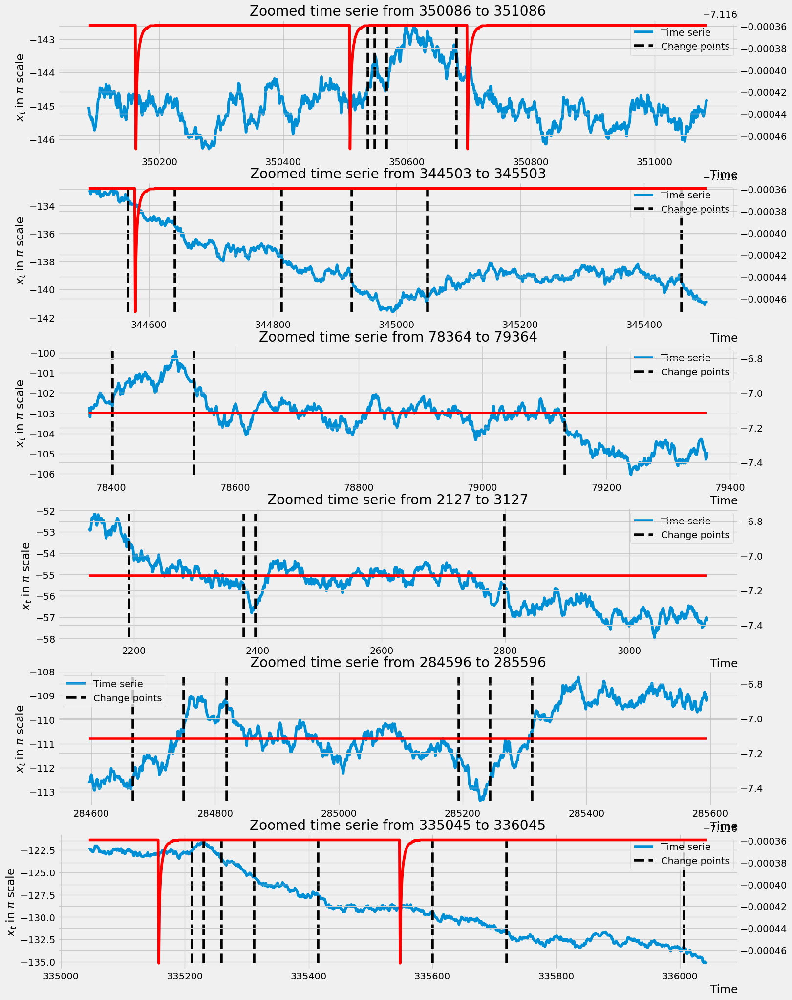

In [12]:
demonstrate_result(ts[T:], cp_ixs[np.where(cp_ixs >= T)], probs[T:], T=T, val=True)

# Эксперимент 34:

несбалансированный. признаки вида $y_t = x_t - x_{t-1}$

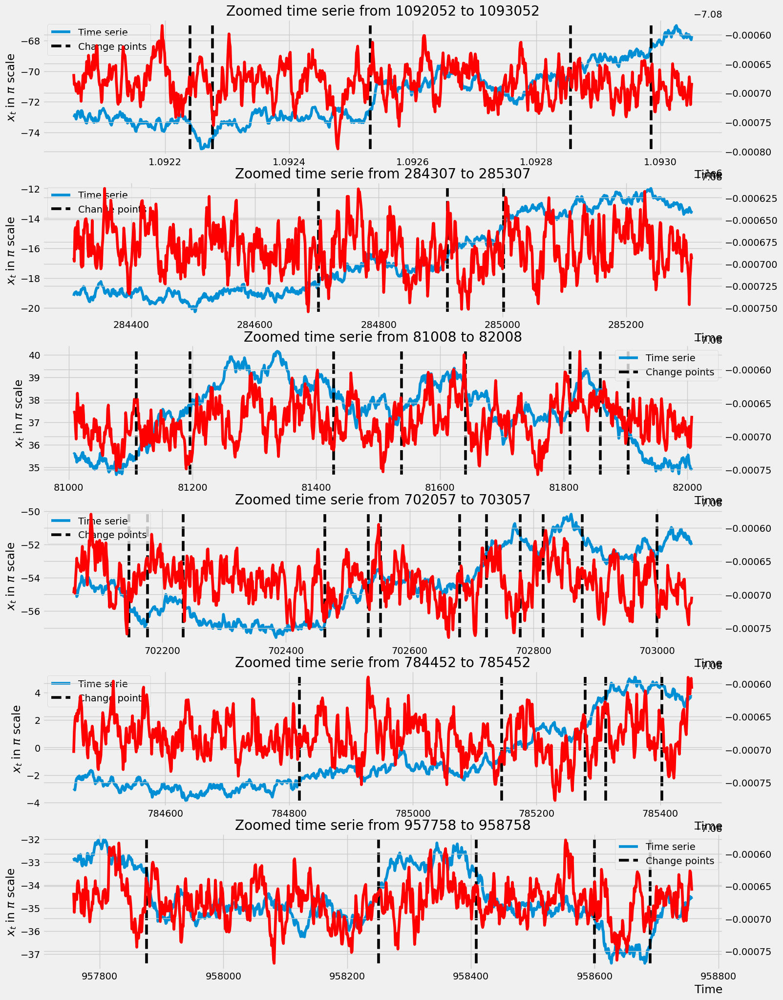

In [13]:
with open('ts_probs/000_34.npy', 'rb') as f:
    probs = np.load(f)
cp_ixs = np.array(cp_ixs)
demonstrate_result(ts[:T], cp_ixs[np.where(cp_ixs < T)], probs[:T], T=T)

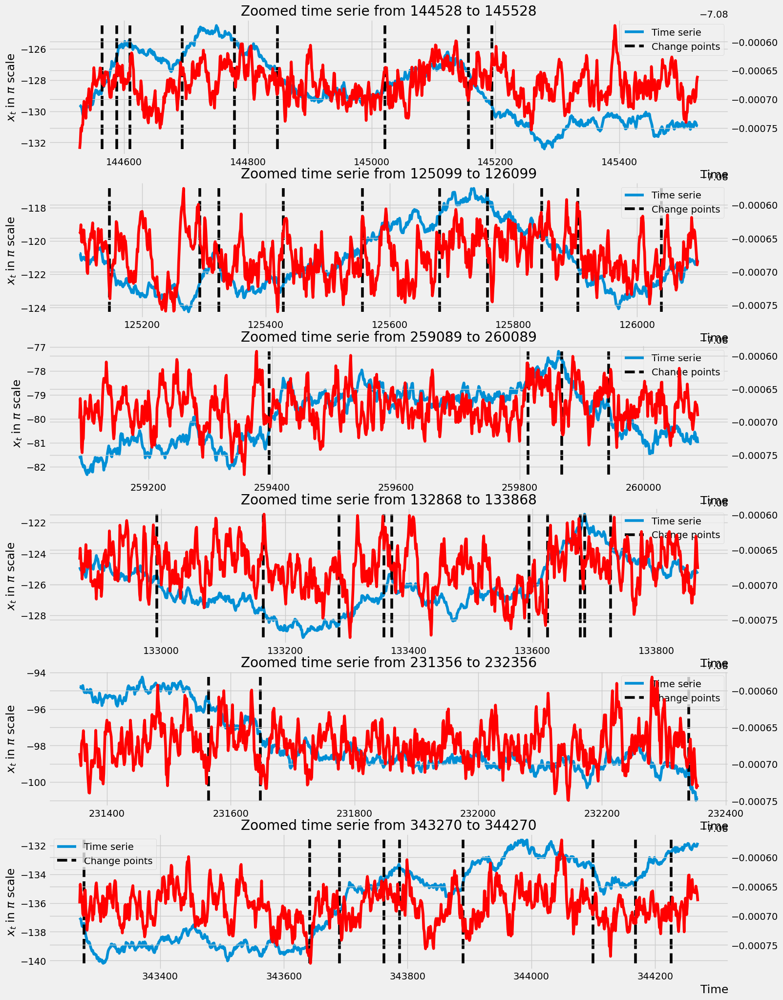

In [14]:
demonstrate_result(ts[T:], cp_ixs[np.where(cp_ixs >= T)], probs[T:], T=T, val=True)

# Эксперимент 36. Undersampling. Абсолютные значения: 

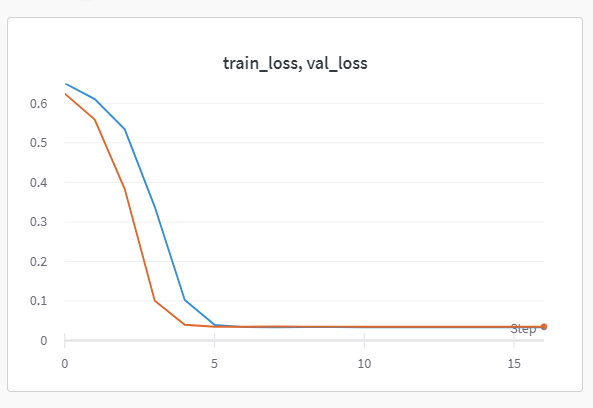

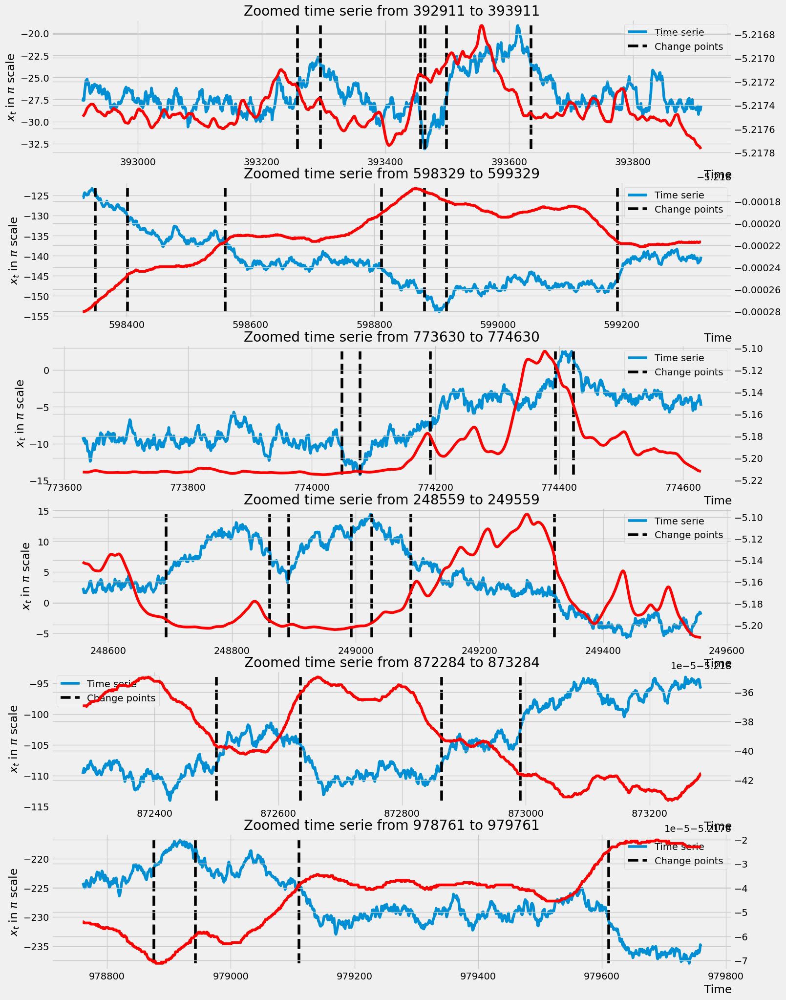

In [6]:
with open('timeseries/timeserie_000.npy', 'rb') as f:
    ts = np.load(f)
with open('ts_probs/000_36.npy', 'rb') as f:
    probs = np.load(f)
T = round(0.75 * len(ts))
cp_ixs = find_change_points(ts, 1)
cp_ixs = np.array(cp_ixs)
demonstrate_result(ts[:T], cp_ixs[np.where(cp_ixs < T)], probs[:T], T=T)

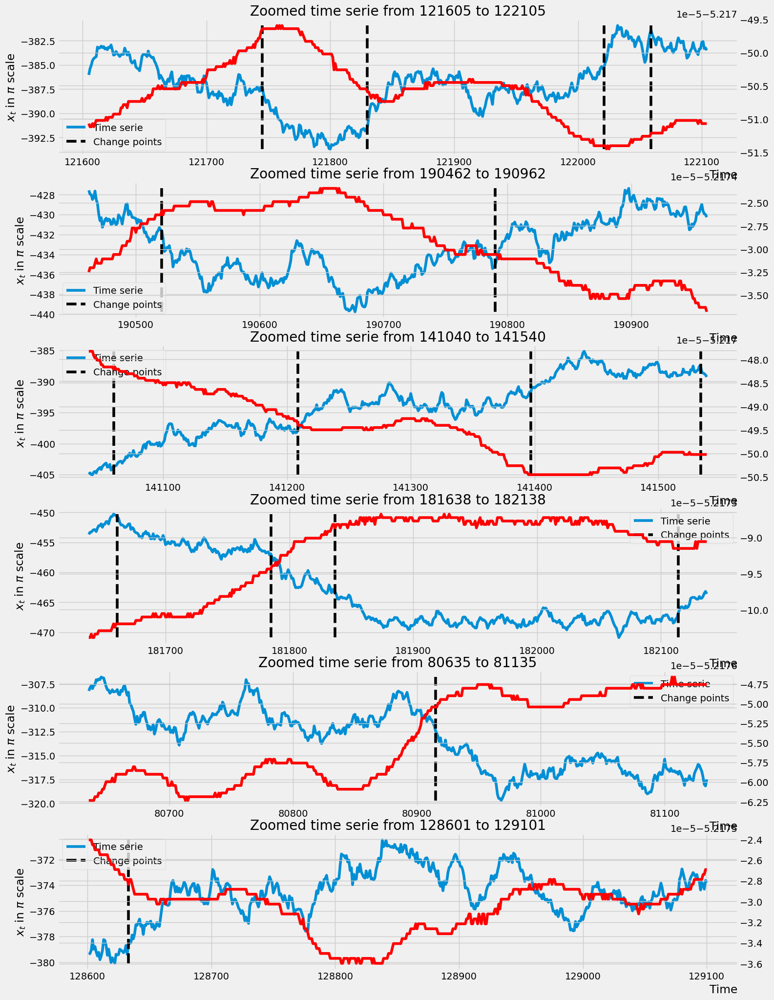

In [8]:
demonstrate_result(ts[T:], cp_ixs[np.where(cp_ixs >= T)], probs[T:], T=T, val=True, seq_len=500)

In [9]:
print(np.min(probs))
print(np.max(probs))

-5.218539237976074
-5.066359519958496


# Эксперимент 37. Undersampling. Бинарные значения:

TODO:

теперь беру другой временной ряд:

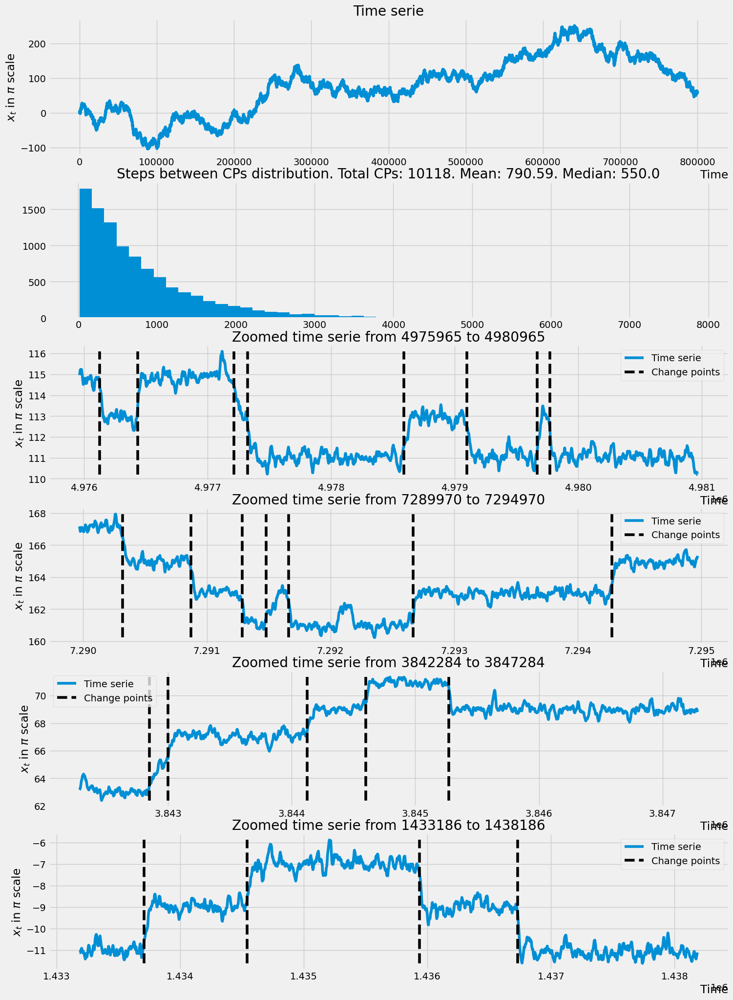

In [6]:
STEP_SIZE = 0.1
MIN_STABILITY_DURATION = 1
ID = '001'
TS_PARAMS = {
    'x0': np.pi,
    'lambd': 2,
    'n_steps': 8000000,
    'alpha': 0.88,
    'D': 1
}
integral_algo = IntegralAlgorithm(**TS_PARAMS)
ts, _ = integral_algo.generate(step_size=STEP_SIZE)
cp_ixs = find_change_points(ts, 1)
ts = demonstrate(TS_PARAMS, STEP_SIZE, ts, cp_ixs, bins=50, subseq_len=5000)

далее будут рассматриваться только сбалансированные методы, так как обучение на дефолтных данных показали себя плохо:

# Генерируем временной ряд с pink noise:

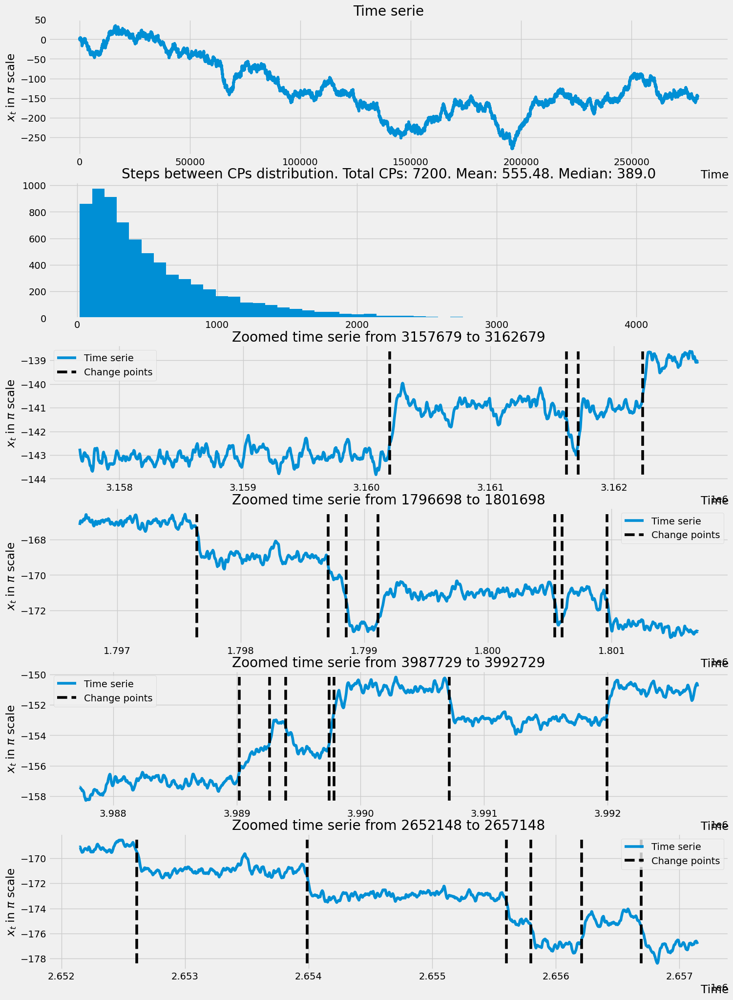

In [3]:
STEP_SIZE = 0.07
MIN_STABILITY_DURATION = 1
ID = '002'
TS_PARAMS = {
    'x0': np.pi,
    'lambd': 1.25,
    'n_steps': 4000000,
    'alpha': 1.05,
}
integral_algo = IntegralAlgorithm(**TS_PARAMS)
ts, _ = integral_algo.generate(step_size=STEP_SIZE)
cp_ixs = find_change_points(ts, 1)
ts = demonstrate(TS_PARAMS, STEP_SIZE, ts, cp_ixs, bins=50, subseq_len=5000)

In [4]:
with open('timeseries/timeserie_002.npy', 'wb') as f:
    np.save(f, ts)

# Эксперимент 40. Временной ряд 002. Абсолютные значения. Андерсэмплинг

divine-vortex-40

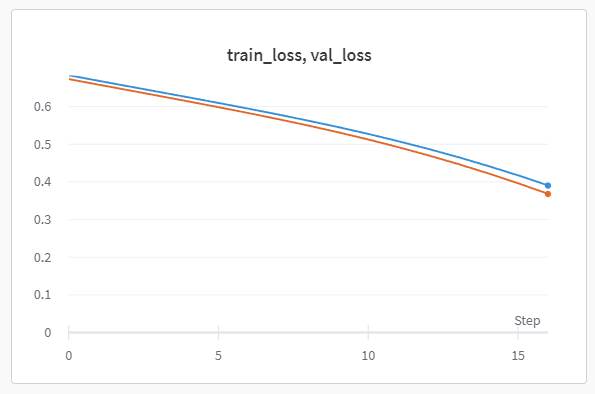

Визуализация функции оценки:

In [4]:
from scipy.special import expit, logit

with open('timeseries/timeserie_002.npy', 'rb') as f:
    ts = np.load(f)
with open('ts_probs/002_40.npy', 'rb') as f:
    probs = np.load(f)
T = round(0.75 * len(ts))
cp_ixs = find_change_points(ts, 1)
cp_ixs = np.array(cp_ixs)
probs = expit(probs)

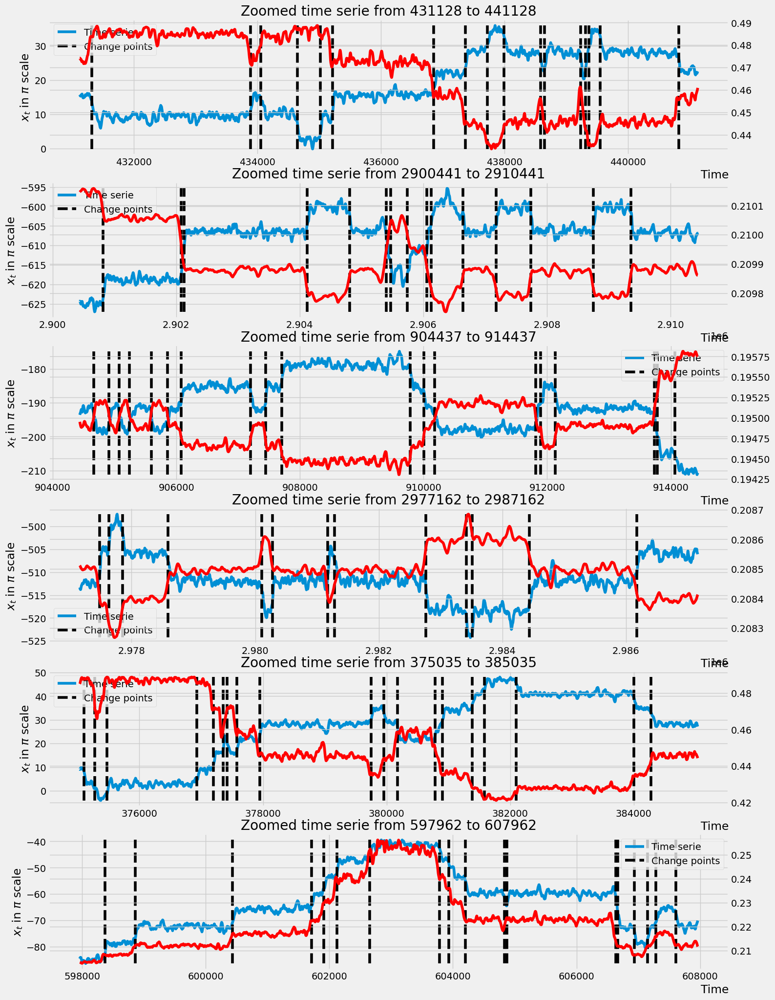

In [13]:
demonstrate_result(ts, cp_ixs[np.where(cp_ixs < T)], probs[:T], T=T, seq_len=10000)

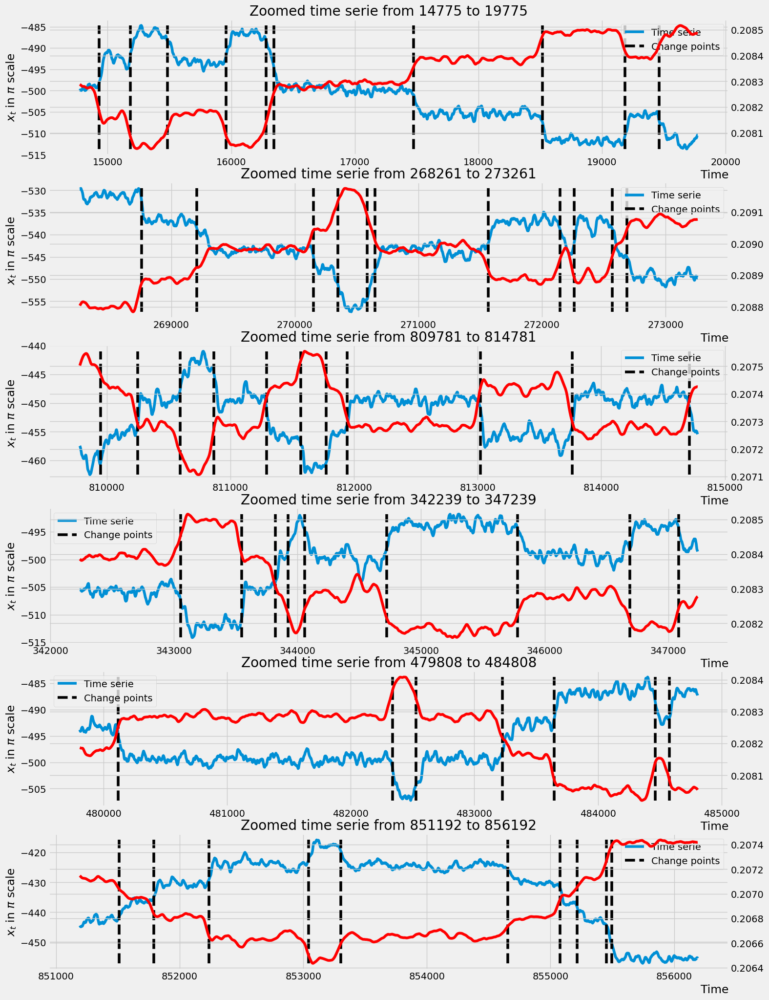

In [26]:
demonstrate_result(ts[T:], cp_ixs[np.where(cp_ixs >= T)], probs[T:], T=T, val=True, seq_len=5000)

In [14]:
np.min(probs)

0.19401575361475074

In [15]:
np.max(probs)

0.4887490007976194

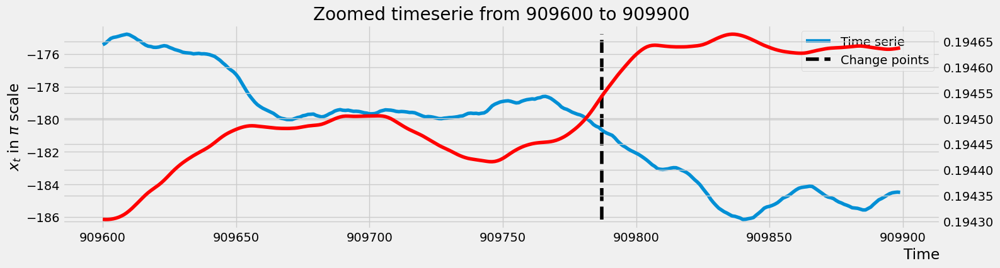

In [20]:
from synth_ts.synth_timeserie_generator import show_zoomed_result

show_zoomed_result(ts, cp_ixs, probs, T, LB=909600, RB=909900, val=False)

# 42 hidden dim скрыт в два раза

In [23]:
from scipy.special import expit, logit

with open('timeseries/timeserie_002.npy', 'rb') as f:
    ts = np.load(f)
with open('ts_probs/002_42.npy', 'rb') as f:
    probs = np.load(f)
T = round(0.75 * len(ts))
cp_ixs = find_change_points(ts, 1)
cp_ixs = np.array(cp_ixs)
probs = expit(probs)

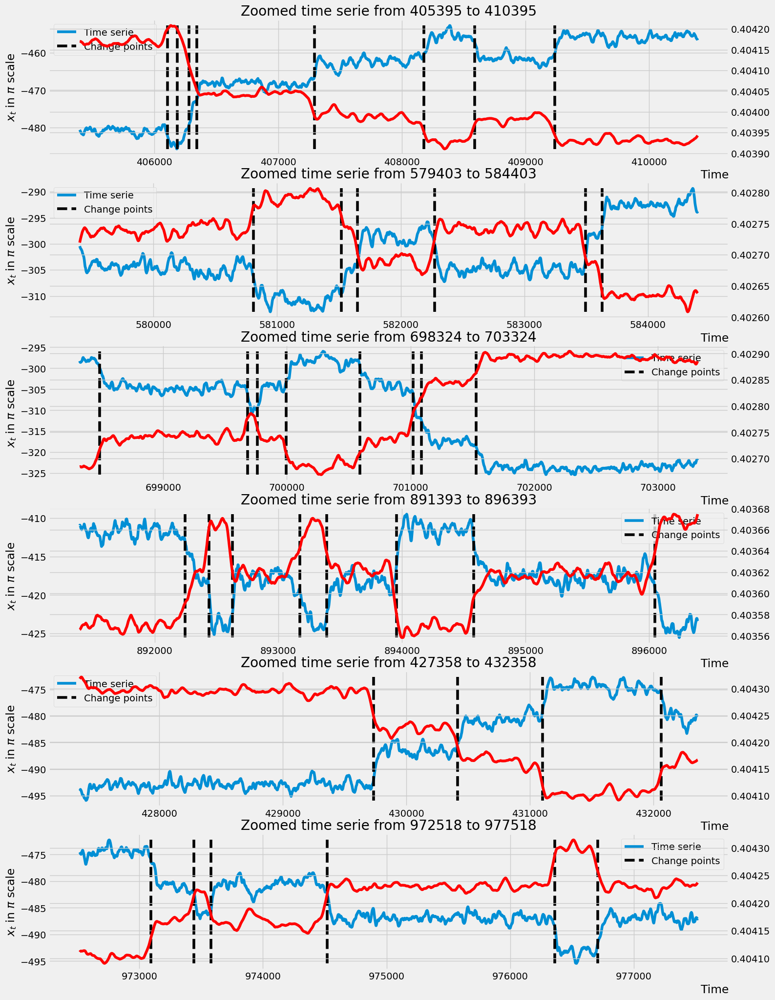

In [24]:
demonstrate_result(ts[T:], cp_ixs[np.where(cp_ixs >= T)], probs[T:], T=T, val=True, seq_len=5000)

# 43. honest-shadow-43

In [27]:
from scipy.special import expit, logit

with open('timeseries/timeserie_002.npy', 'rb') as f:
    ts = np.load(f)
with open('ts_probs/002_43.npy', 'rb') as f:
    probs = np.load(f)
T = round(0.75 * len(ts))
cp_ixs = find_change_points(ts, 1)
cp_ixs = np.array(cp_ixs)
probs = expit(probs)

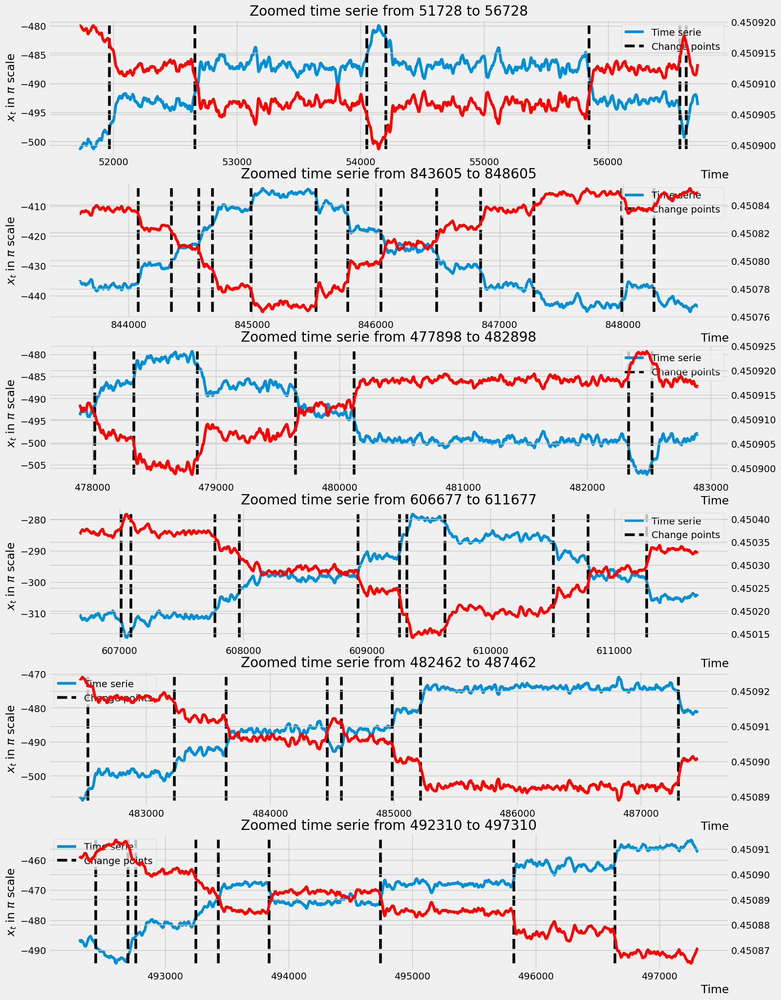

In [28]:
demonstrate_result(ts[T:], cp_ixs[np.where(cp_ixs >= T)], probs[T:], T=T, val=True, seq_len=5000)

# 44

In [29]:
from scipy.special import expit, logit

with open('timeseries/timeserie_002.npy', 'rb') as f:
    ts = np.load(f)
with open('ts_probs/002_44.npy', 'rb') as f:
    probs = np.load(f)
T = round(0.75 * len(ts))
cp_ixs = find_change_points(ts, 1)
cp_ixs = np.array(cp_ixs)
probs = expit(probs)

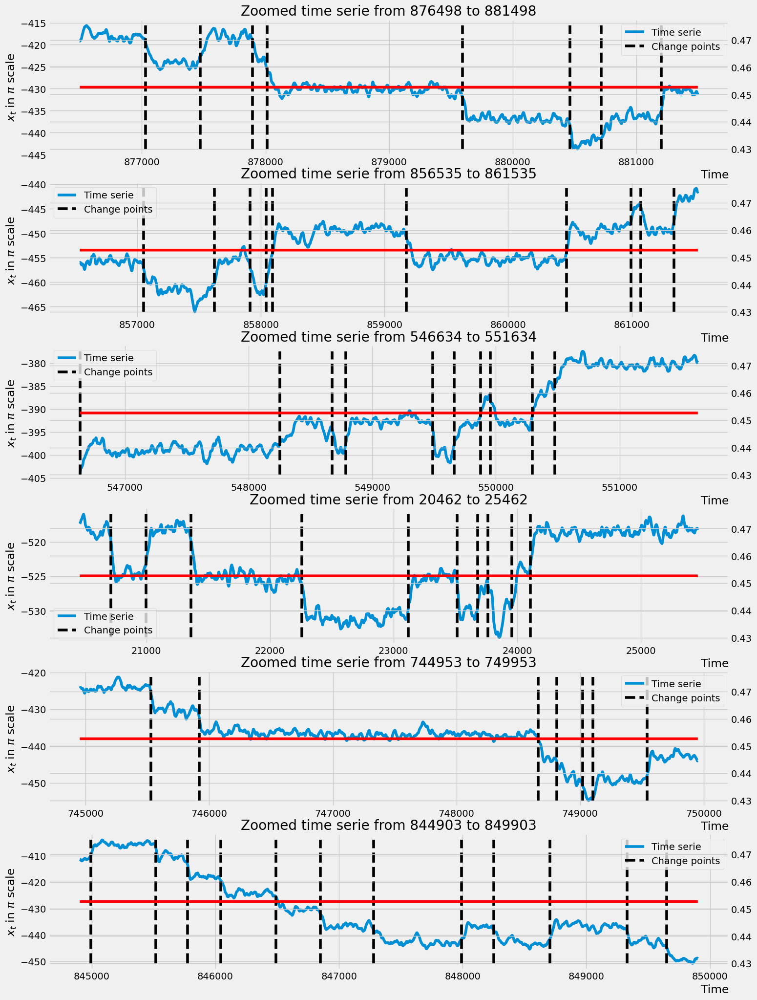

In [30]:
demonstrate_result(ts[T:], cp_ixs[np.where(cp_ixs >= T)], probs[T:], T=T, val=True, seq_len=5000)

# 56. Предсказываю на признаках $\frac{x_{t} - x_{t-1}}{x_{t-1}}$:

In [40]:
from scipy.special import expit, logit

with open('timeseries/timeserie_002.npy', 'rb') as f:
    ts = np.load(f)
with open('ts_probs/002_56.npy', 'rb') as f:
    probs = np.load(f)
T = round(0.75 * len(ts))
cp_ixs = find_change_points(ts, 1)
cp_ixs = np.array(cp_ixs)
probs = expit(probs)

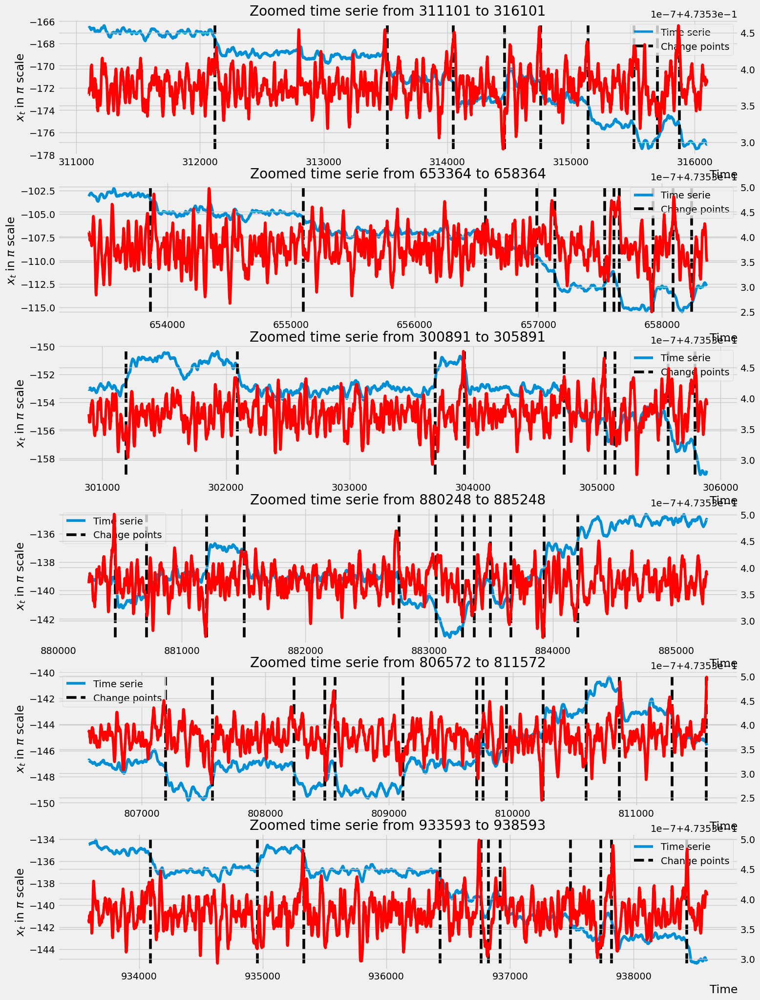

In [42]:
demonstrate_result(ts[T:], cp_ixs[np.where(cp_ixs >= T)], probs[T:], T=T, val=True, seq_len=5000)

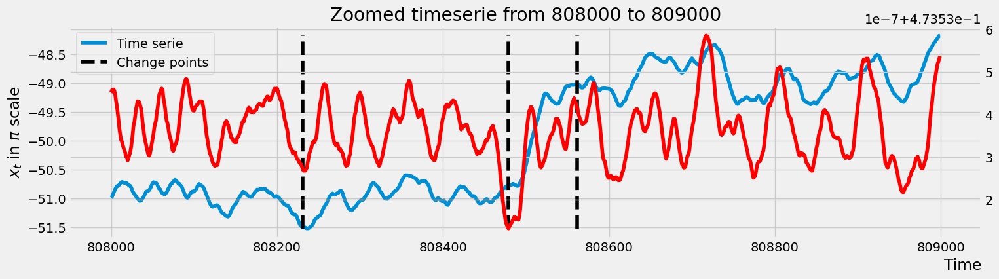

In [44]:
from synth_ts.synth_timeserie_generator import show_zoomed_result

show_zoomed_result(ts, cp_ixs[np.where(cp_ixs >= T)], probs, T, LB=808000, RB=809000, val=True)

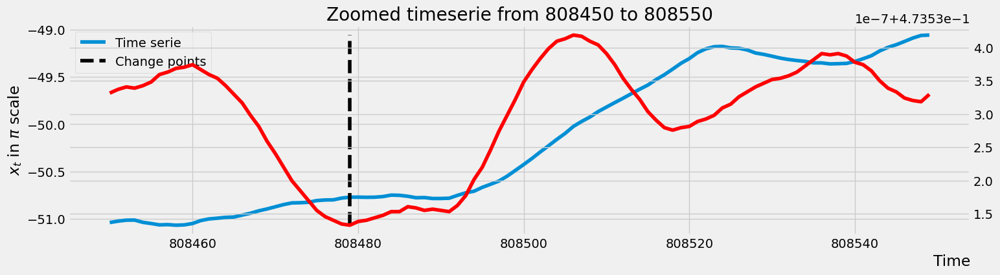

: 

In [46]:
show_zoomed_result(ts, cp_ixs[np.where(cp_ixs >= T)], probs, T, LB=808450, RB=808550, val=True)